In [1]:
%load_ext autoreload
%autoreload 2

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.svm import LinearSVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

from dataloaders import Dataloader, MnistSpikesDataloader
from spiking import iterate_spikes
from spiking.layers import IntegrateAndFireOptimizedLayer
from spiking.learning import STDP
from spiking.competition import WinnerTakesAll
from spiking.evaluation import SpikingClassifierEvaluator

from visualization import SpikesVisualization

In [3]:
dataloader = MnistSpikesDataloader("./data/mnist-subset", 'train')
validation_dataloader = MnistSpikesDataloader("./data/mnist-subset", 'test')
max_x, max_y = dataloader.inputs[0].shape
max_z = 2
max_input_spikes = max_x * max_y * max_z
print(f"{max_input_spikes = }")

max_input_spikes = 1568


## Helper functions

In [27]:
def train(if_layer: IntegrateAndFireOptimizedLayer, num_epochs: int):
    for epoch_idx in range(1, num_epochs + 1):
        for batch_idx, (spikes, label, times) in enumerate(dataloader.iterate(batch_size=1), start=1):
            should_visualize = epoch_idx % 4 == 0 and batch_idx <= 3

            membrane_potentials = []
            membrane_potentials_times = []
            
            for incoming_spikes, current_time, dt in iterate_spikes(spikes, shape=(max_x, max_y, max_z)):
                output_spike = if_layer.forward(incoming_spikes.flatten(), current_time=current_time, dt=dt)

                if should_visualize:
                    if np.any(output_spike == 1.0):
                        membrane_potentials.append([
                            if_layer.threshold[idx] if output_spike[idx] else if_layer.membrane_potentials[idx]
                            for idx in range(if_layer.num_outputs)
                        ])
                        membrane_potentials_times.append(current_time)
                    membrane_potentials.append(if_layer.membrane_potentials.copy())
                    membrane_potentials_times.append(current_time)
            
            pre_spike_times = times.flatten()
            if_layer.backward(pre_spike_times)

            if should_visualize:
                post_spike_times = if_layer.spike_times

                SpikesVisualization.plot_pre_post_spikes(
                    pre_spike_times,
                    post_spike_times,
                    title=f"Pre-synaptic vs Post-synaptic. Epoch {epoch_idx} - Batch {batch_idx} - Label {label}",
                    unique_colors=True
                )
                SpikesVisualization.plot_multiple_membrane_potentials(
                    membrane_potentials,
                    membrane_potentials_times,
                    title=f"Membrane Potential Over Time. Epoch {epoch_idx} - Batch {batch_idx} - Label {label}"
                )
            
            if_layer.reset()

def dataloader_to_spike_times(model: IntegrateAndFireOptimizedLayer, arg_dataloader: Dataloader):
    X, y = [], []
    for batch_idx, (spikes, label, _) in enumerate(arg_dataloader.iterate(batch_size=1), start=1):
        for incoming_spikes, current_time, dt in iterate_spikes(spikes, shape=(max_x, max_y, max_z)):
            model.forward(incoming_spikes.flatten(), current_time=current_time, dt=dt)
        X.append(model.spike_times)
        y.append(label)
        model.reset()
    return np.array(X), np.array(y)

def eval_snn(model: IntegrateAndFireOptimizedLayer):
    evaluator = SpikingClassifierEvaluator(model, dataloader, validation_dataloader, shape=(max_x, max_y, max_z))
    print(f"{evaluator.X_train.shape = }, {evaluator.y_train.shape = }")
    print(f"{evaluator.X_test.shape = }, {evaluator.y_test.shape = }")

    evaluator.plot_reduced_dataset("train")
    evaluator.plot_reduced_dataset("val")
    evaluator.train_classifier_and_compute_metrics()

def visualize_neurons(model: IntegrateAndFireOptimizedLayer):
    for i in range(model.num_outputs):
        img = model.weights[i].reshape((max_z, max_x, max_y))
        plt.title(f"Weights {i}")
        plt.axis("off")
        plt.subplot(1, 2, 1)
        plt.imshow(img[0, :, :], cmap='grey')
        plt.axis("off")
        plt.subplot(1, 2, 2)
        plt.imshow(img[1, :, :], cmap='grey')
        plt.axis("off")
        plt.show()

In [23]:
stdp = STDP()
wta = WinnerTakesAll()
if_layer_20 = IntegrateAndFireOptimizedLayer(
    num_inputs=max_input_spikes, num_outputs=20, learning_mechanism=stdp, competition_mechanism=wta, threshold=8.0, refractory_period=np.inf
)

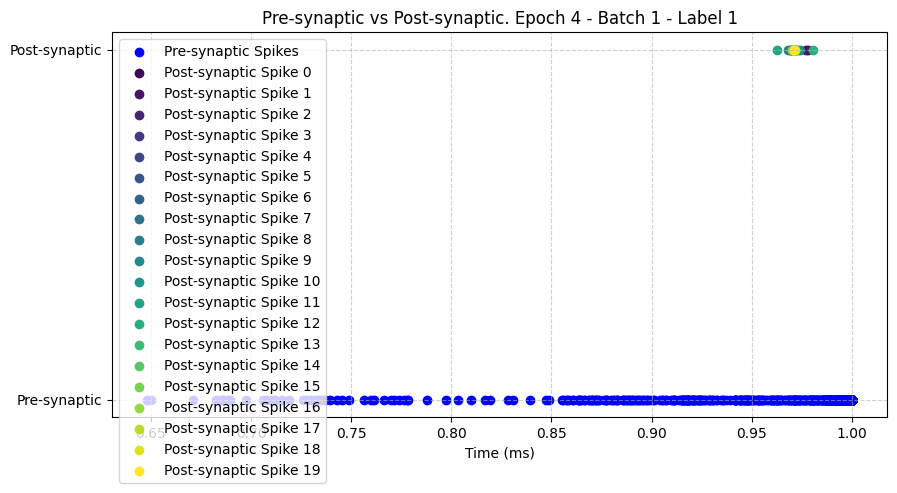

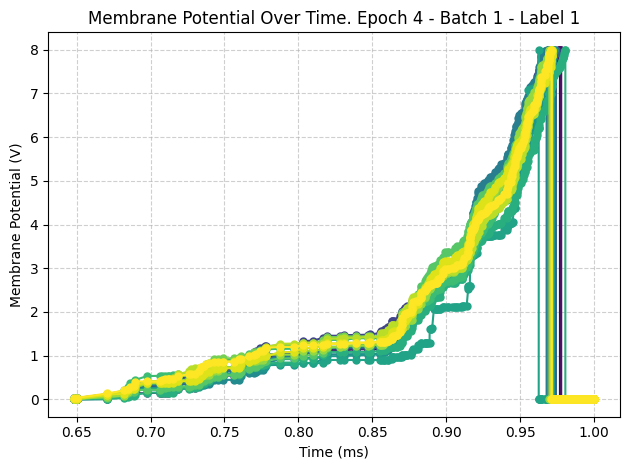

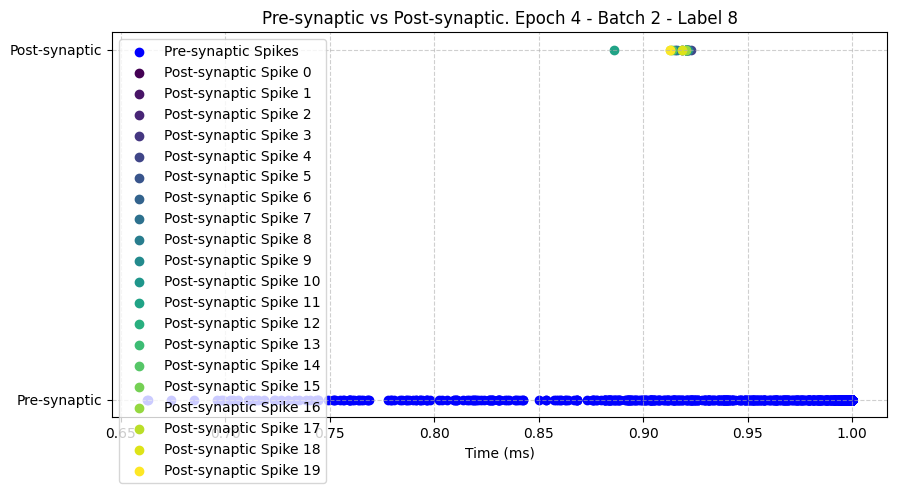

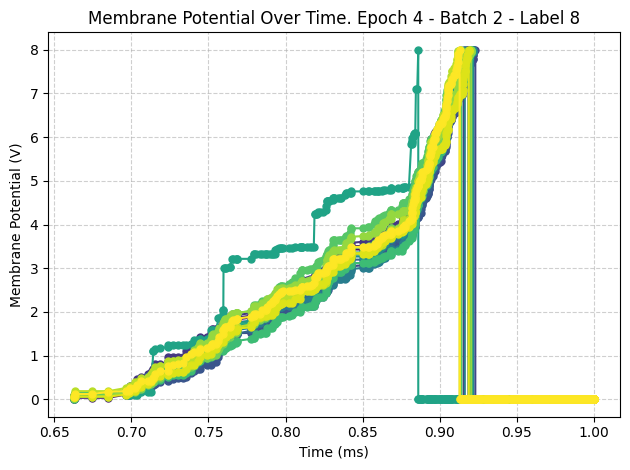

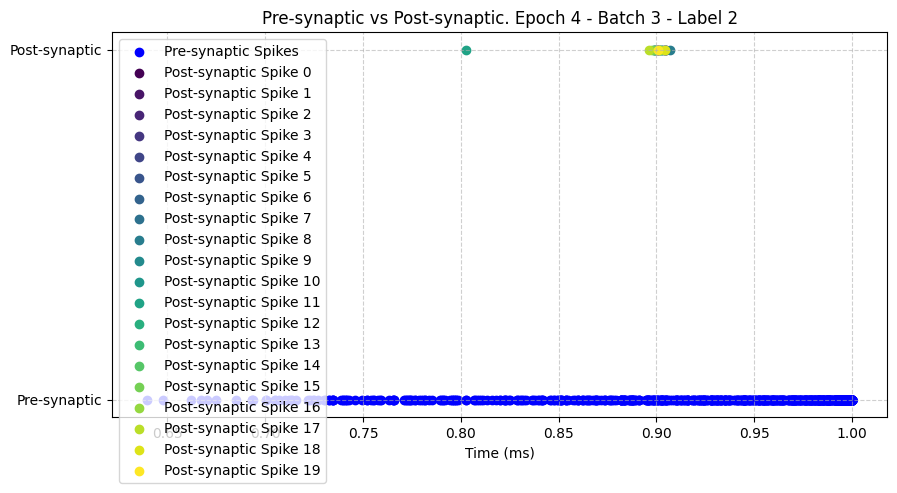

...

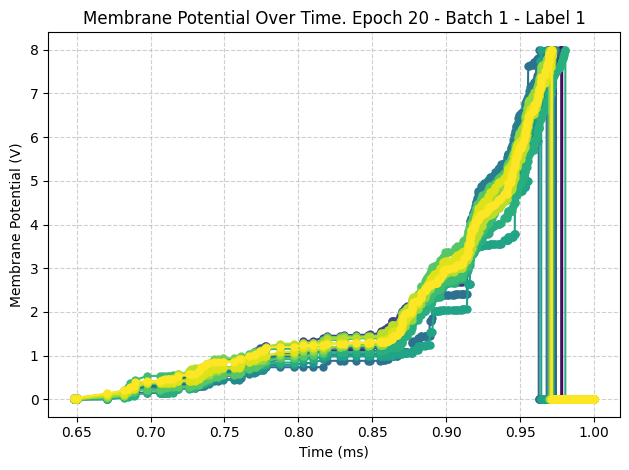

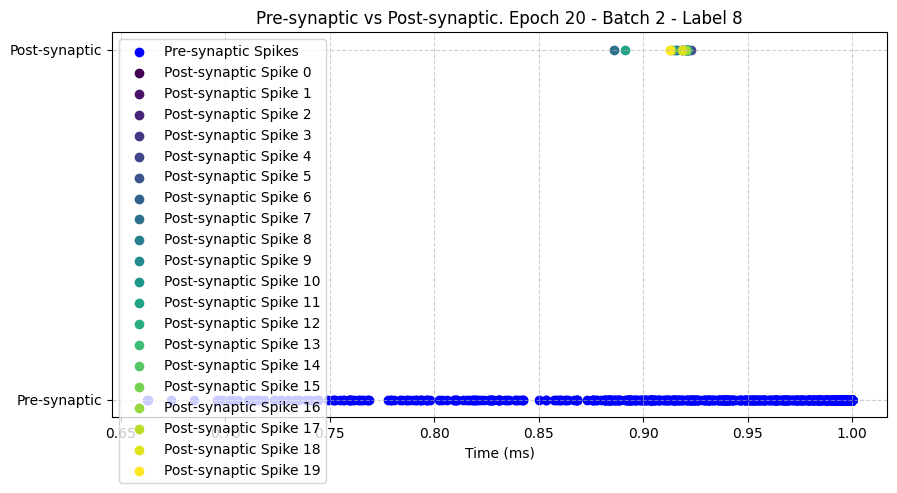

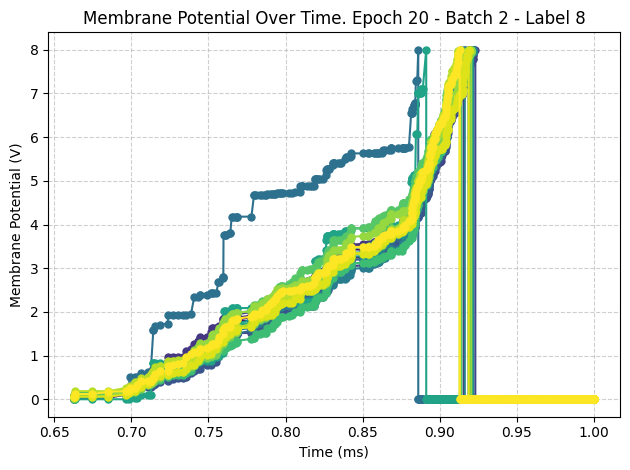

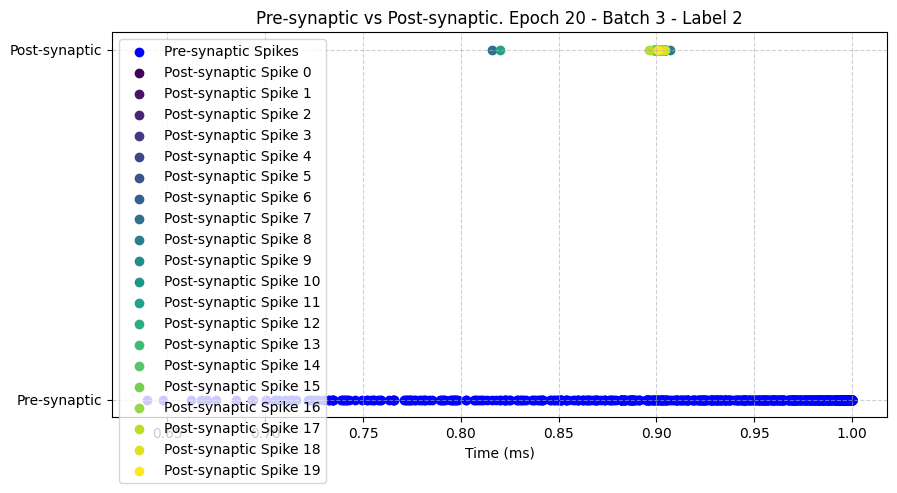

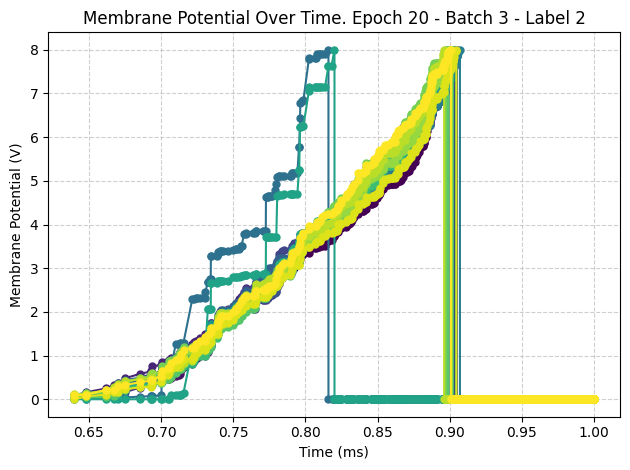

In [24]:
train(if_layer_20, 20)

evaluator.X_train.shape = (600, 20), evaluator.y_train.shape = (600,)
evaluator.X_test.shape = (100, 20), evaluator.y_test.shape = (100,)


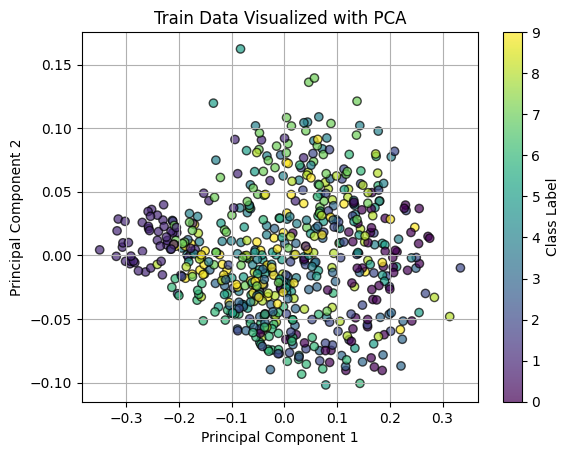

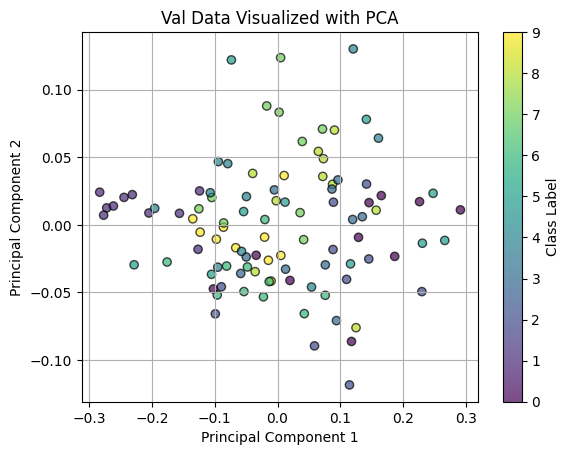

Train accuracy: 0.3883333333333333
Accuracy: 0.36
Precision: 0.30
Recall: 0.36
F1 Score: 0.31


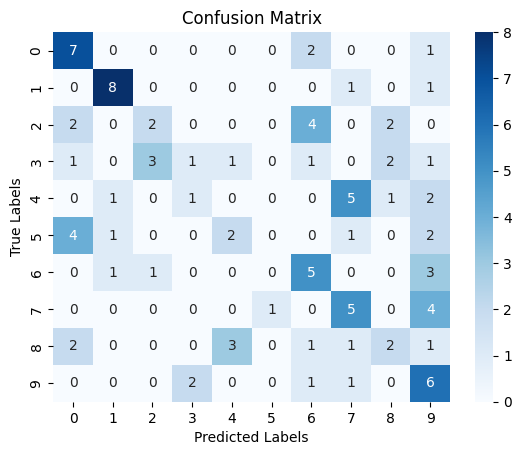

In [28]:
eval_snn(if_layer_20)

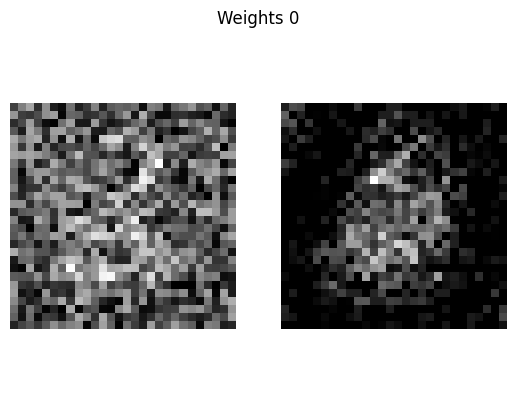

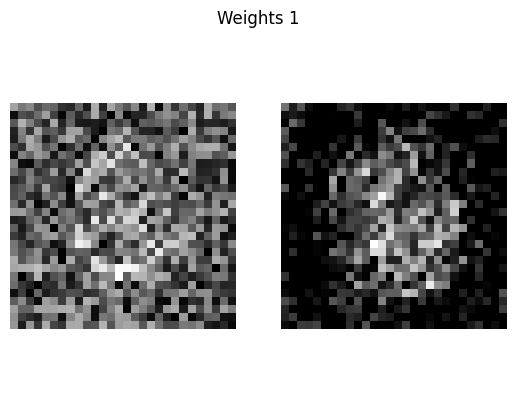

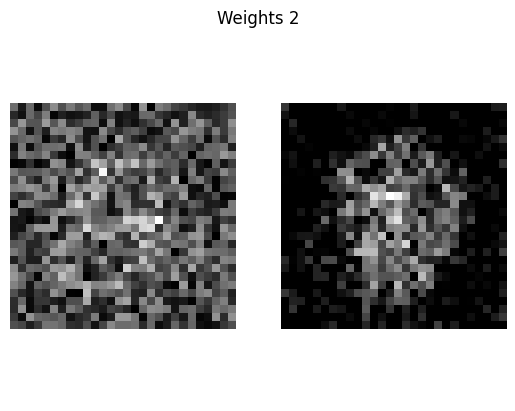

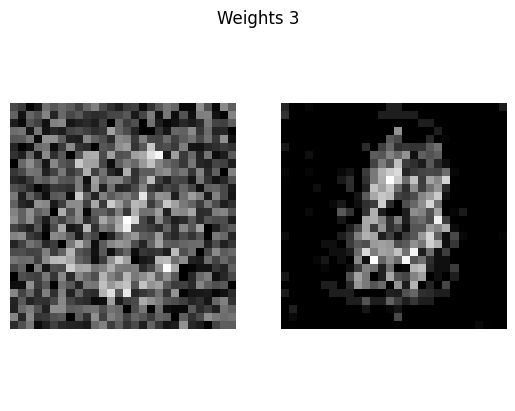

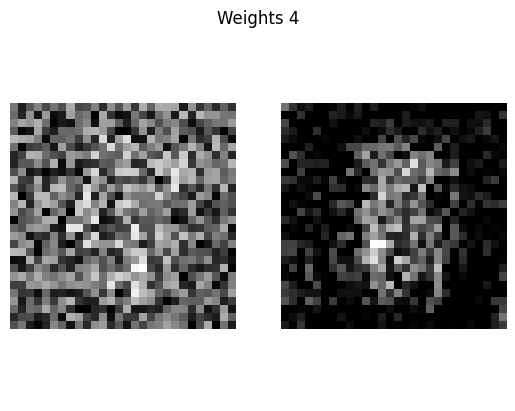

...

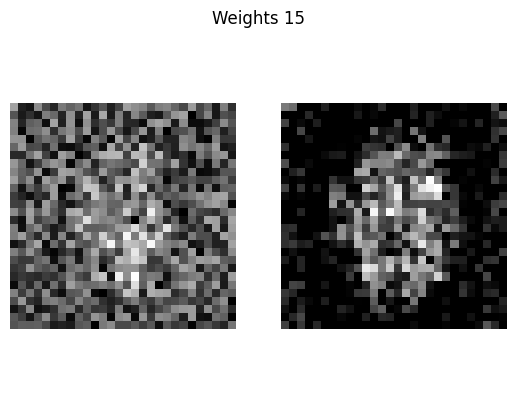

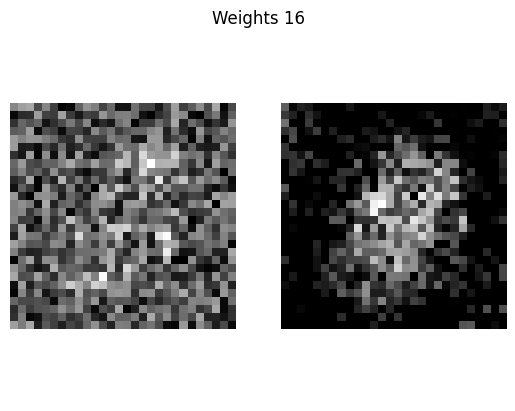

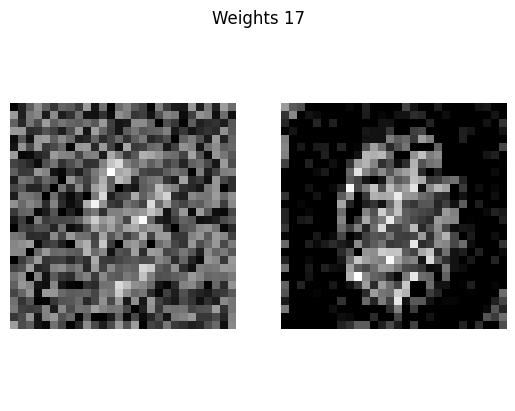

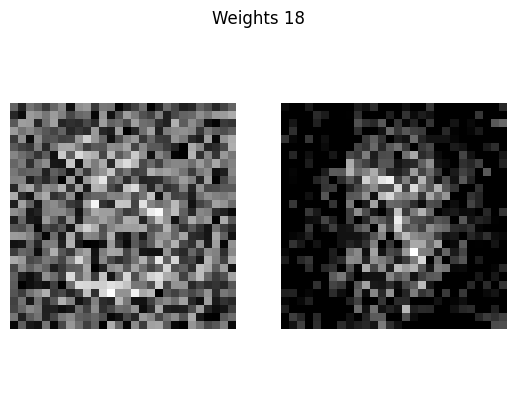

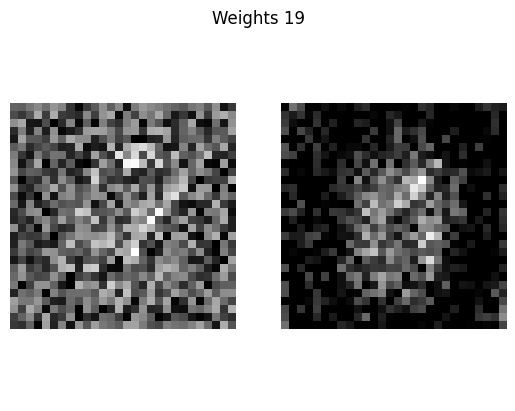

In [30]:
visualize_neurons(if_layer_20)

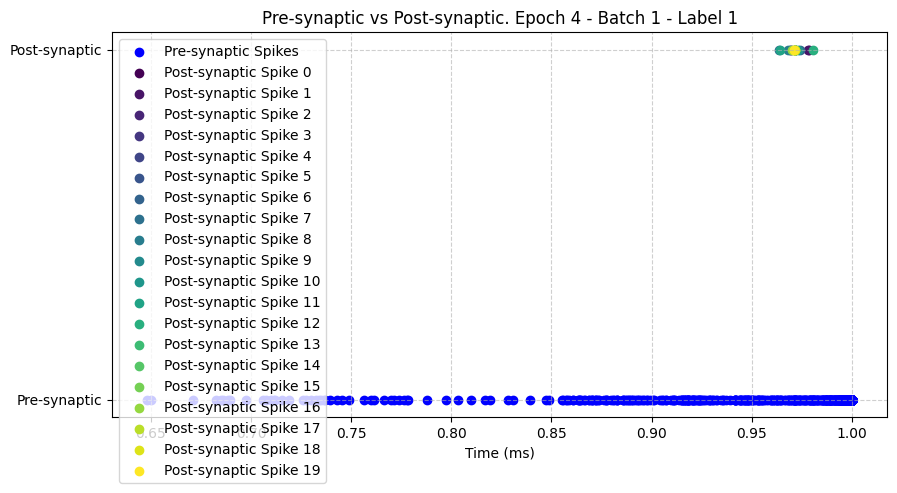

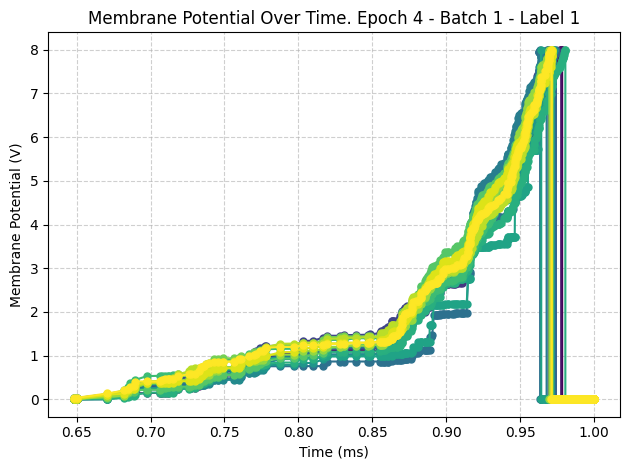

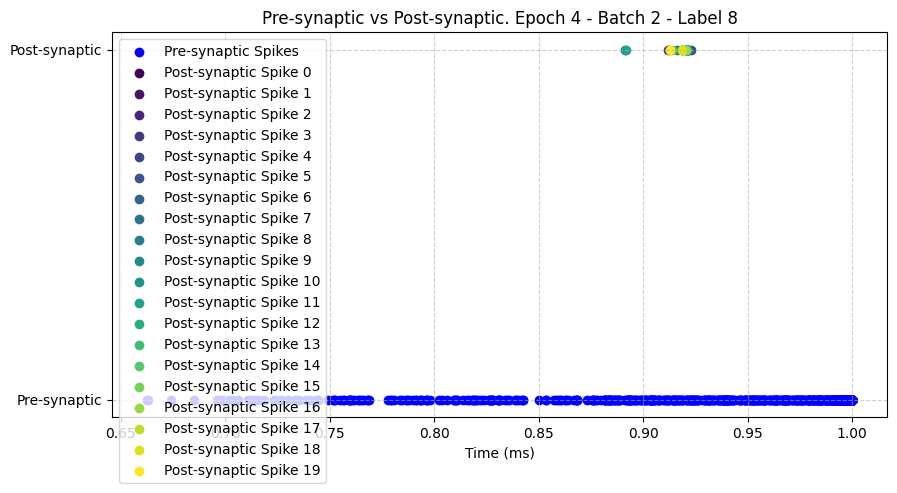

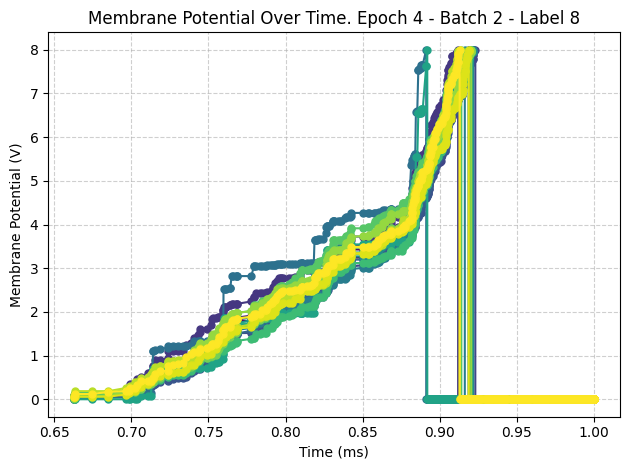

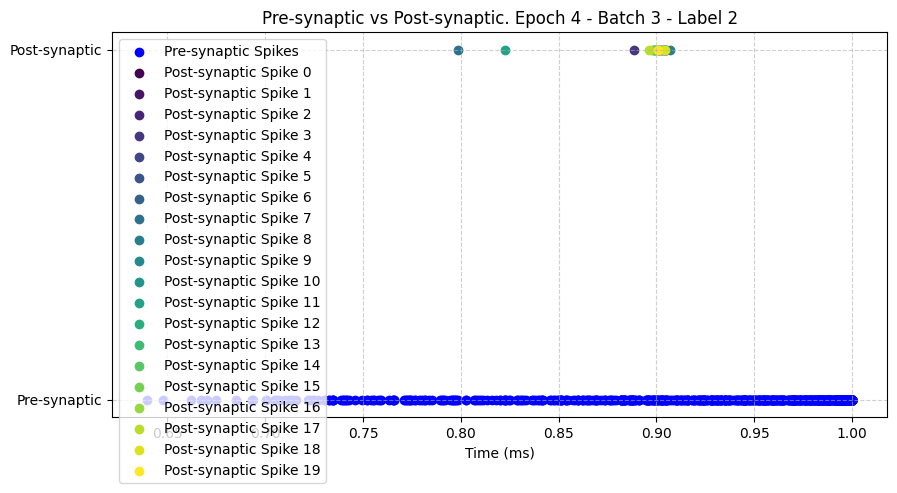

...

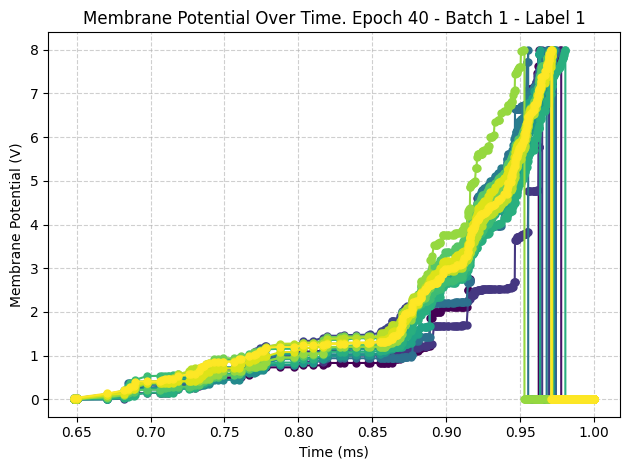

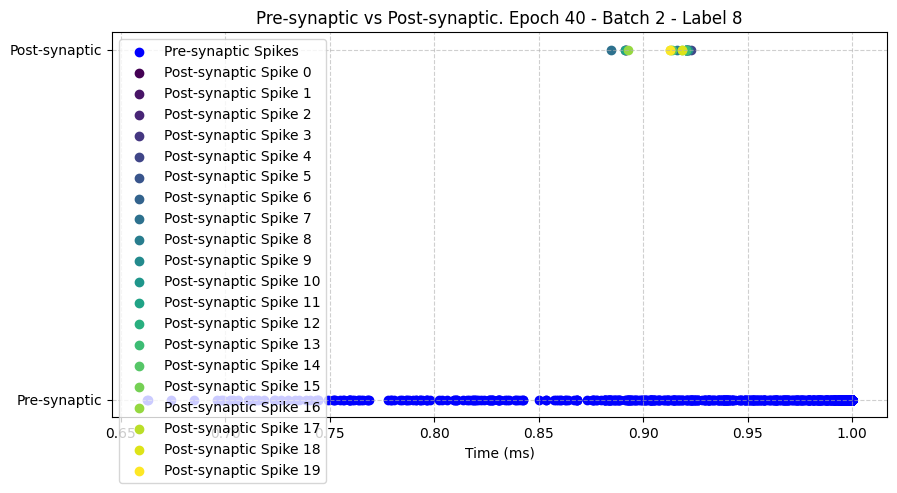

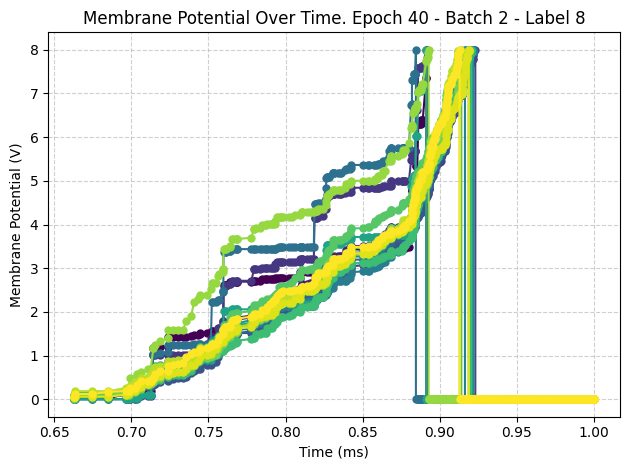

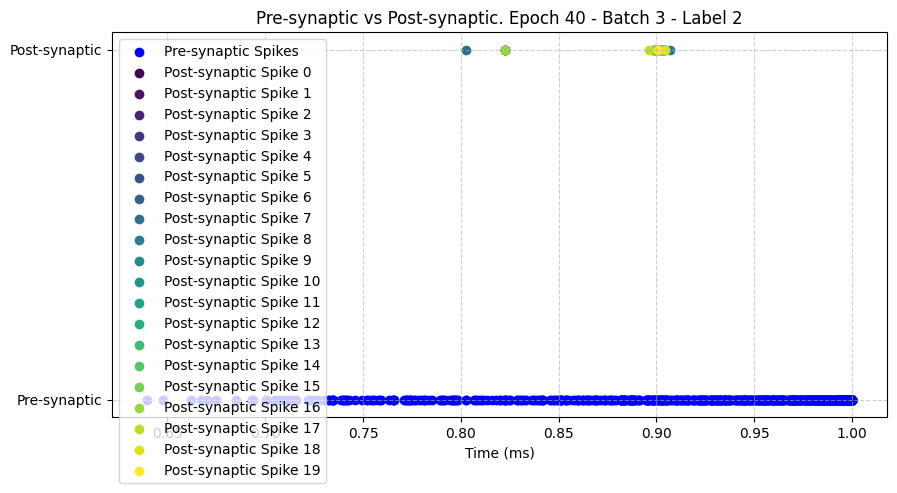

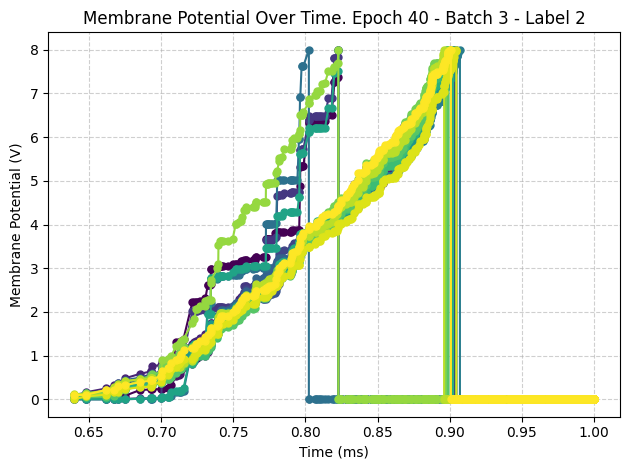

In [31]:
train(if_layer_20, 40)

evaluator.X_train.shape = (600, 20), evaluator.y_train.shape = (600,)
evaluator.X_test.shape = (100, 20), evaluator.y_test.shape = (100,)


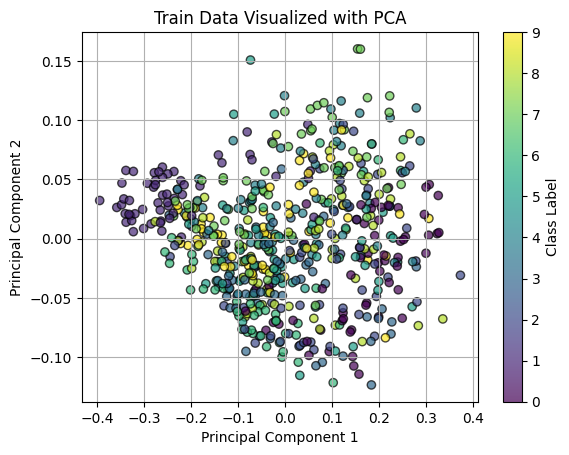

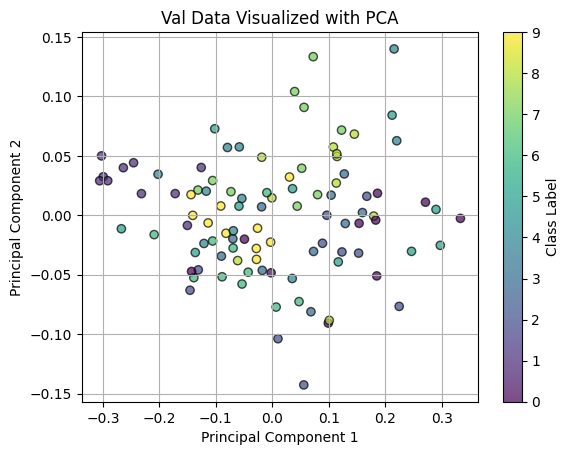

Train accuracy: 0.3933333333333333
Accuracy: 0.39
Precision: 0.35
Recall: 0.39
F1 Score: 0.34


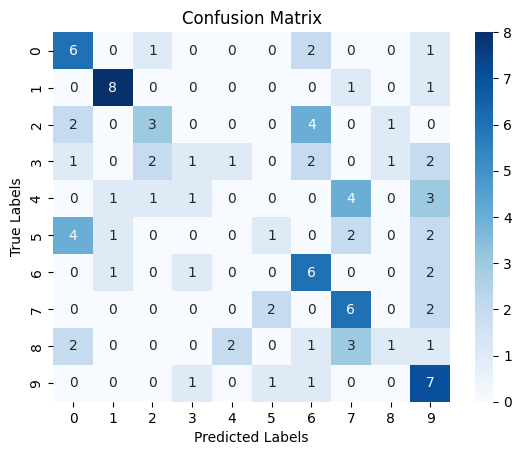

In [32]:
eval_snn(if_layer_20)

[autoreload of spiking.threshold.adaptation.adaptation failed: Traceback (most recent call last):
  File "/Users/Razvan/Uni/dummy-snn/venv/lib/python3.11/site-packages/IPython/extensions/autoreload.py", line 276, in check
    superreload(m, reload, self.old_objects)
    
  File "/Users/Razvan/Uni/dummy-snn/venv/lib/python3.11/site-packages/IPython/extensions/autoreload.py", line 475, in superreload
    module = reload(module)
    
  File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/importlib/__init__.py", line 169, in reload
    _bootstrap._exec(spec, module)
    
  File "<frozen importlib._bootstrap>", line 621, in _exec
  File "<frozen importlib._bootstrap_external>", line 940, in exec_module
  File "<frozen importlib._bootstrap>", line 241, in _call_with_frames_removed
  File "/Users/Razvan/Uni/dummy-snn/spiking/threshold/adaptation/adaptation.py", line 6, in <module>
    class ThresholdAdaptation(ABC):
  File "/Users/Razvan/Uni/dummy-snn/spiking/threshold/adap

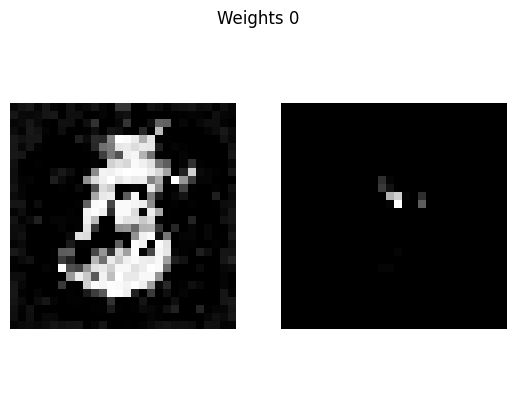

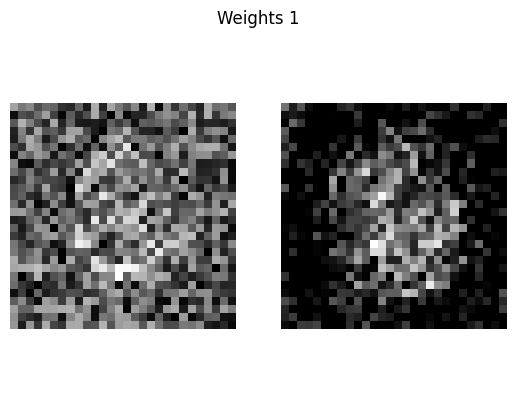

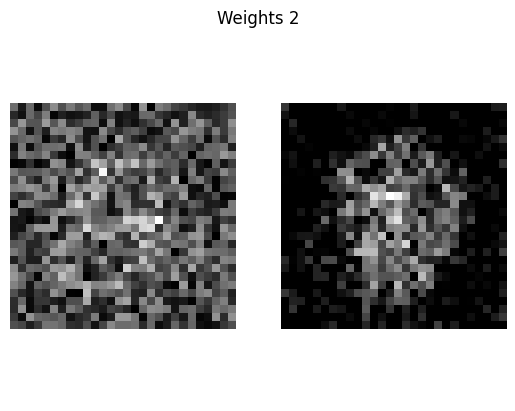

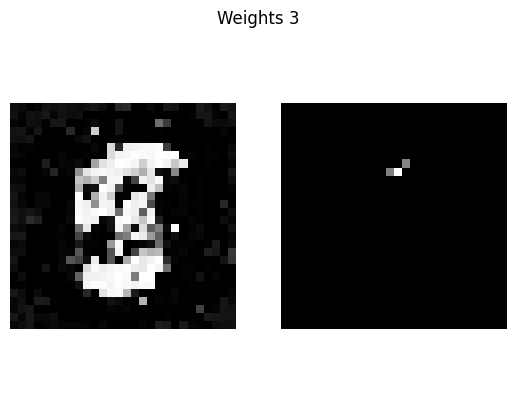

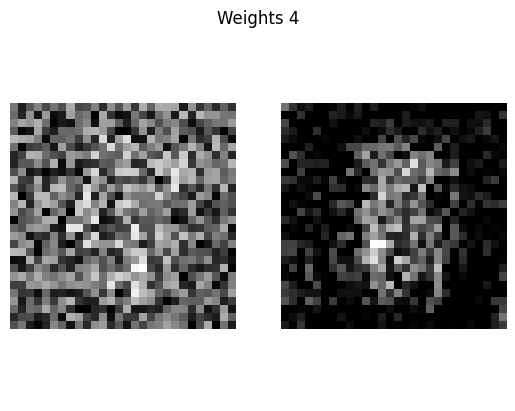

...

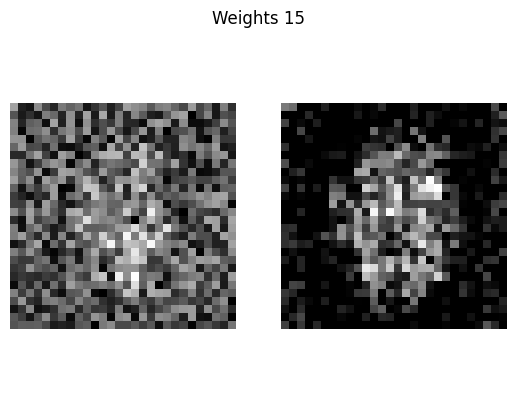

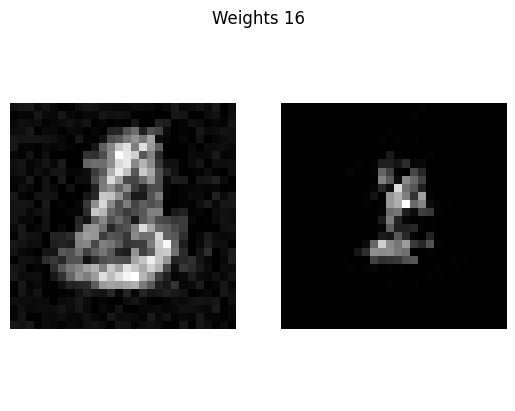

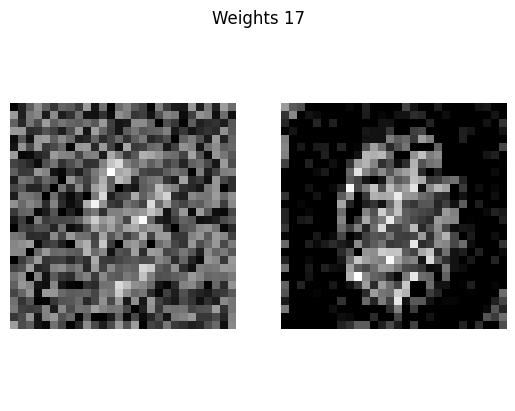

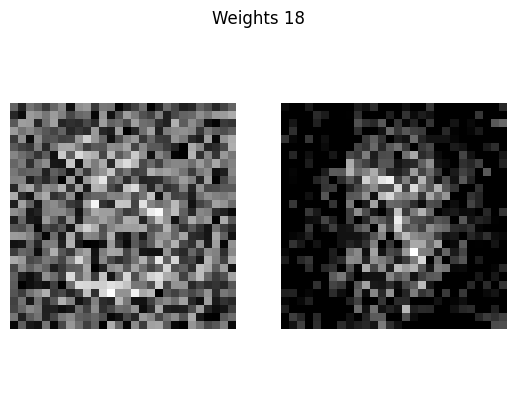

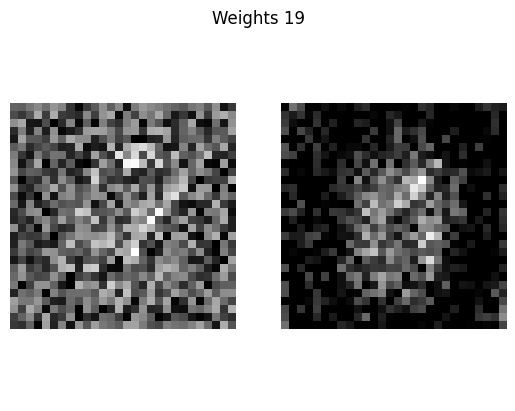

In [34]:
visualize_neurons(if_layer_20)